In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import seaborn as sns
%matplotlib inline

import tensorflow as tf
from tensorflow import keras

import gc
gc.enable()

import warnings
warnings.filterwarnings("ignore")
pd.options.display.max_columns = None

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

In [2]:
model = keras.models.load_model('model_amazon_top_10_cats_50plus_ratings_.h5')

# Import Data

In [3]:
filename = 'amazon_top_10_cats_50plus_ratings'
reviews = pd.read_pickle(filename + '.pkl')
print(reviews.shape)
reviews.head()

(13211310, 8)


,user_id_original,book_id_original,rating,review_text,title,category,user_id,book_id
0,A1DUEKGHT9F8GX,0001381733,5.0,gyo fujikawa is my favorite illustrator of thi...,a child's garden of verses,science fiction & fantasy,0,0
1,A11G2ZH0OXPNKV,0001381733,5.0,a child's garden of verses is a childhood stap...,a child's garden of verses,science fiction & fantasy,1,0
2,A23EB826EWC7EZ,0001381733,5.0,i have my father's book when he was a child bu...,a child's garden of verses,science fiction & fantasy,2,0
3,A1C0VN9HDW6MRS,0001381733,4.0,exactly like my childhood book. in very good s...,a child's garden of verses,science fiction & fantasy,3,0
4,A2EEX7S4T2HNCB,0001381733,5.0,"i had this book when i was a child, and all th...",a child's garden of verses,science fiction & fantasy,4,0


# Dimensionality Reduction

In [4]:
from sklearn.decomposition import PCA

In [5]:
%%time
book_embed = model.get_layer('book_embed')
book_embed_weights = book_embed.get_weights()[0]
book_embed_weights_norm = book_embed_weights / np.linalg.norm(book_embed_weights, axis = 1).reshape((-1, 1))

pca = PCA(n_components=2)
pca_results = pca.fit_transform(book_embed_weights)
pca_results_norm = pca.fit_transform(book_embed_weights_norm)

CPU times: total: 172 ms
Wall time: 181 ms


In [6]:
# top categories
from collections import Counter
word_freqs = Counter([x for x in reviews.category.tolist()])
word_freqs_sorted = sorted(word_freqs.items(), key=lambda item: (-item[1], item[0]))
word_freqs_sorted[:10]

[('mystery, thriller & suspense', 2766346),
 ('genre fiction', 2683994),
 ('romance', 1519448),
 ('christian books & bibles', 1453103),
 ("children's books", 1270403),
 ('science fiction & fantasy', 1043049),
 ('biographies & memoirs', 906373),
 ('health, fitness & dieting', 557785),
 ('cookbooks, food & wine', 511271),
 ('crafts, hobbies & home', 499538)]

In [7]:
top_n_cats = []
for k,v in word_freqs_sorted[:10]:
    top_n_cats.append(k)
top_n_cats

['mystery, thriller & suspense',
 'genre fiction',
 'romance',
 'christian books & bibles',
 "children's books",
 'science fiction & fantasy',
 'biographies & memoirs',
 'health, fitness & dieting',
 'cookbooks, food & wine',
 'crafts, hobbies & home']

In [8]:
# book id's that are in the top 10 categories
include_ids = reviews.book_id[reviews.category.isin(top_n_cats)].drop_duplicates().tolist()
len(include_ids)

64998

In [9]:
# factorizing the categories that are top 10s
ints, gen = pd.factorize(reviews.drop_duplicates(subset=['book_id']).category[reviews.book_id.isin(include_ids)])
print(ints)
print(len(ints))
print(gen)
print(len(gen))

[0 1 2 ... 6 3 6]
64998
Index(['science fiction & fantasy', 'christian books & bibles',
       'children's books', 'mystery, thriller & suspense',
       'cookbooks, food & wine', 'biographies & memoirs', 'genre fiction',
       'romance', 'crafts, hobbies & home', 'health, fitness & dieting'],
      dtype='object')
10


# Output Plots

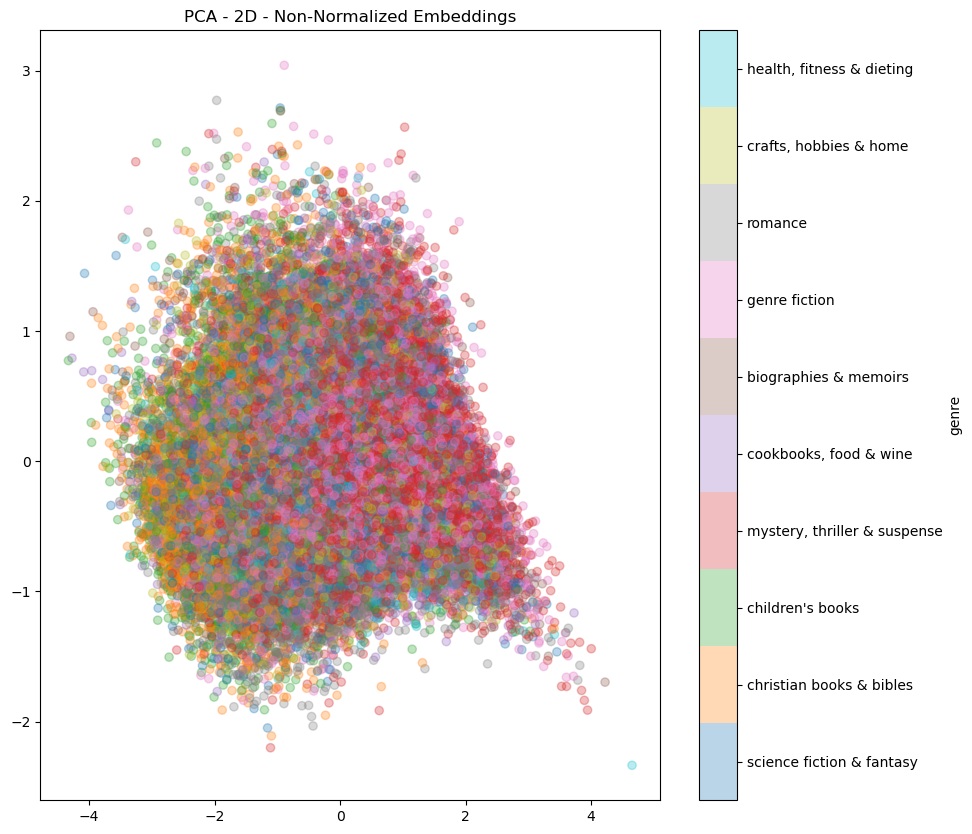

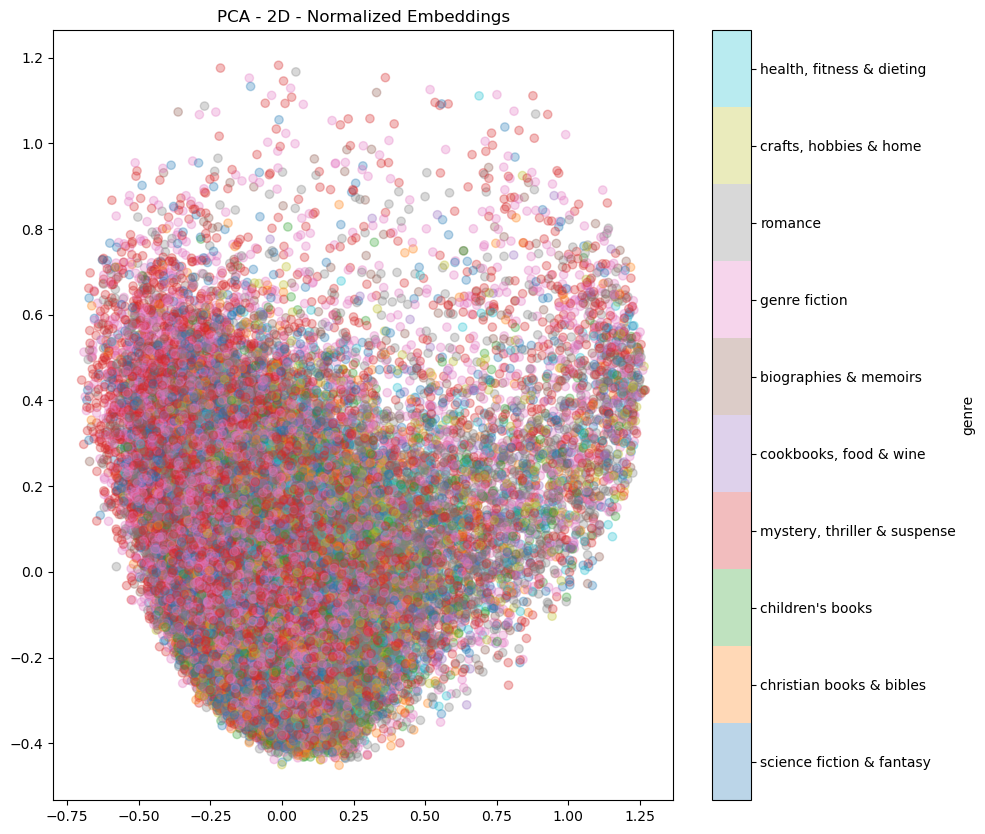

In [10]:
plt.figure(figsize=(10,10))
cmap = plt.cm.tab10
plt.scatter(
    pca_results[include_ids, 0],
    pca_results[include_ids, 1],
    c=ints,
    cmap=cmap,
    alpha=0.3
)

sm = plt.cm.ScalarMappable(cmap=cmap)
cbar = plt.colorbar(
    boundaries=np.arange(len(top_n_cats)+1)-0.5,
    ticks=np.arange(0,len(gen),1), 
    label='genre'
)
cbar.set_ticklabels(gen)
plt.title('PCA - 2D - Non-Normalized Embeddings')
plt.show()

plt.figure(figsize=(10,10))
plt.scatter(
    pca_results_norm[include_ids, 0],
    pca_results_norm[include_ids, 1],
    c=ints,
    cmap=cmap,
    alpha=0.3
)

sm = plt.cm.ScalarMappable(cmap=cmap)
cbar = plt.colorbar(
    boundaries=np.arange(len(top_n_cats)+1)-0.5,
    ticks=np.arange(0,len(gen),1), 
    label='genre'
)
cbar.set_ticklabels(gen)
plt.title('PCA - 2D - Normalized Embeddings')
plt.show()

PCA - 2D - Non-Normalized Embeddings


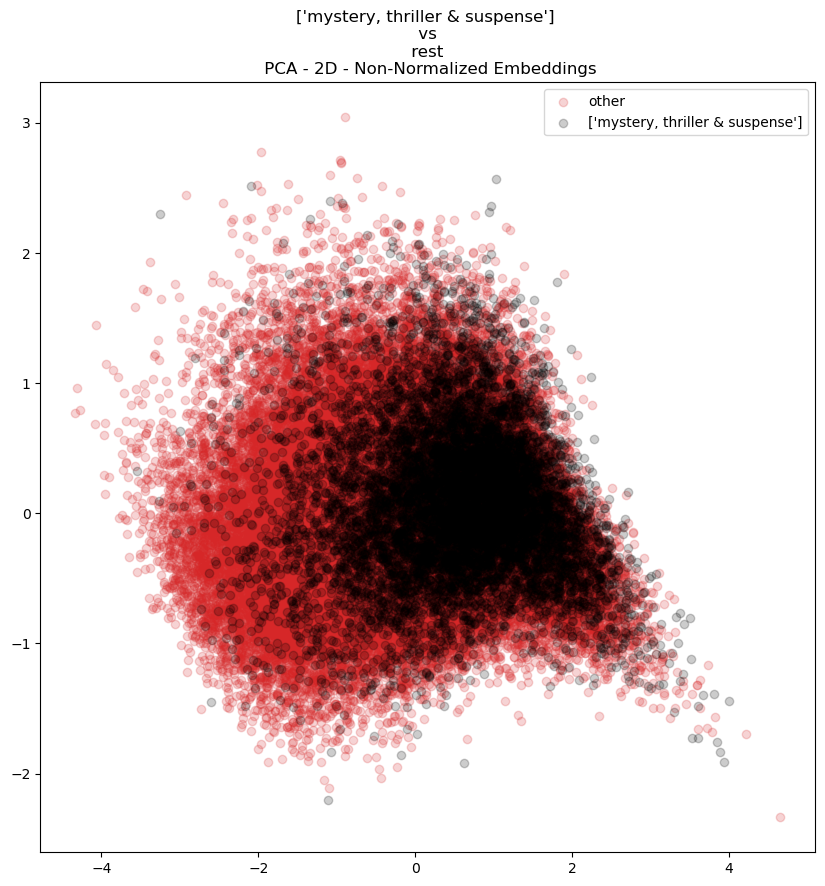

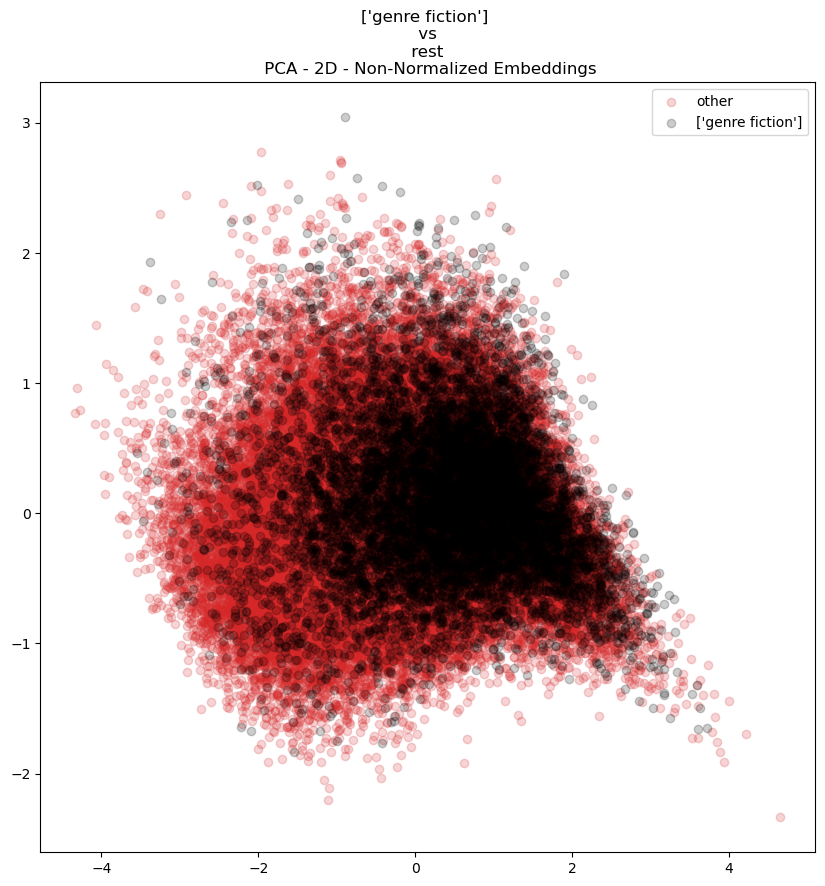

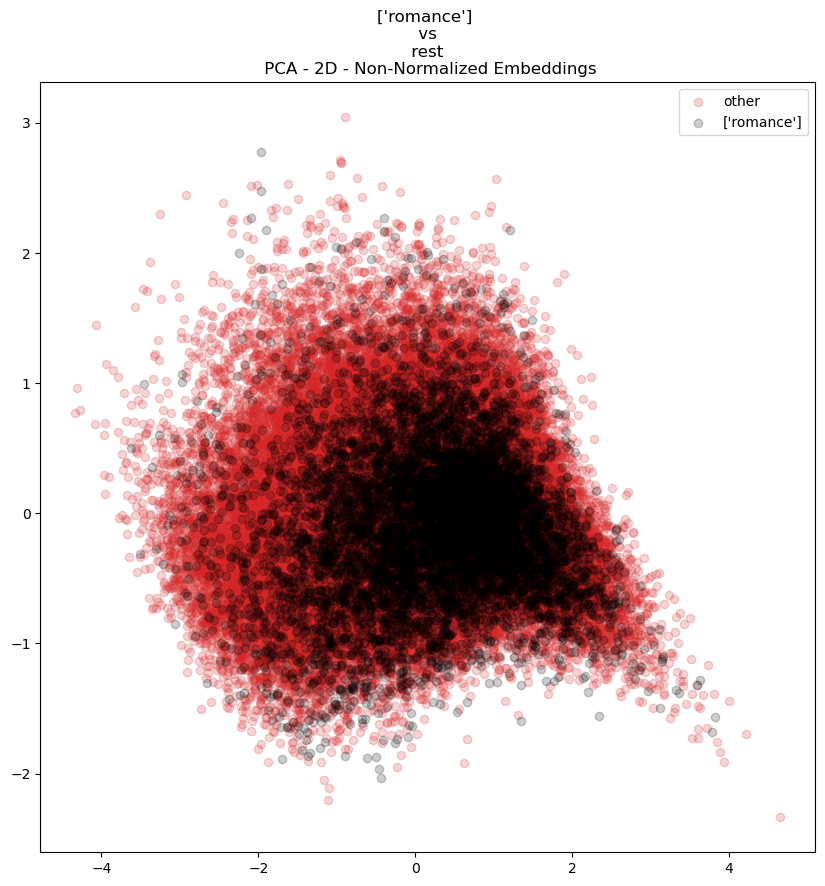

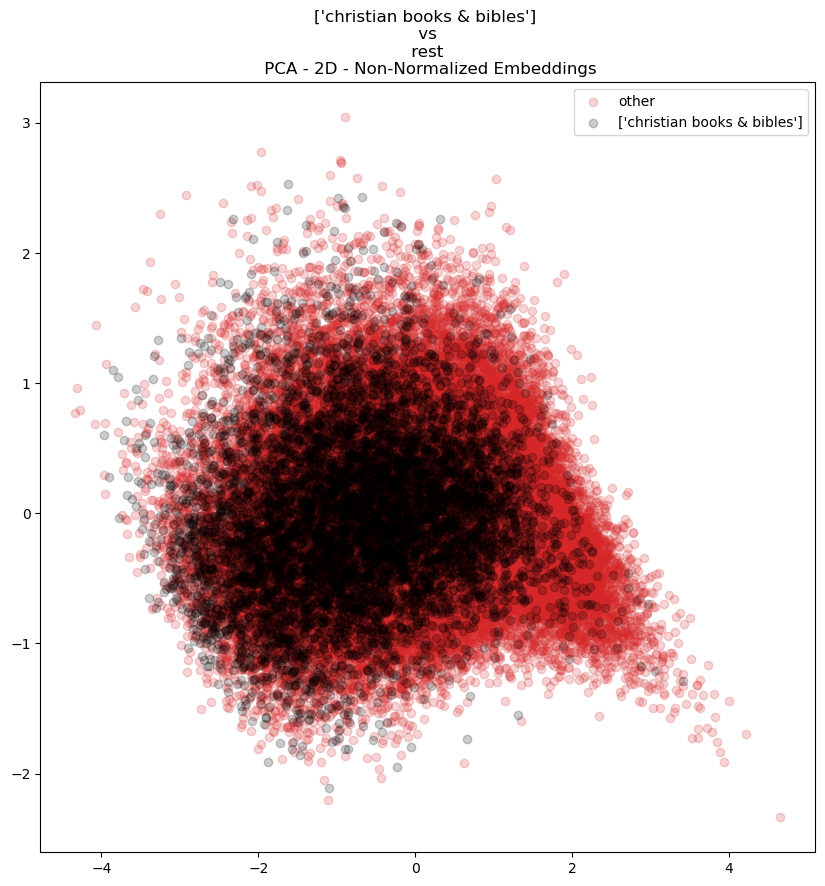

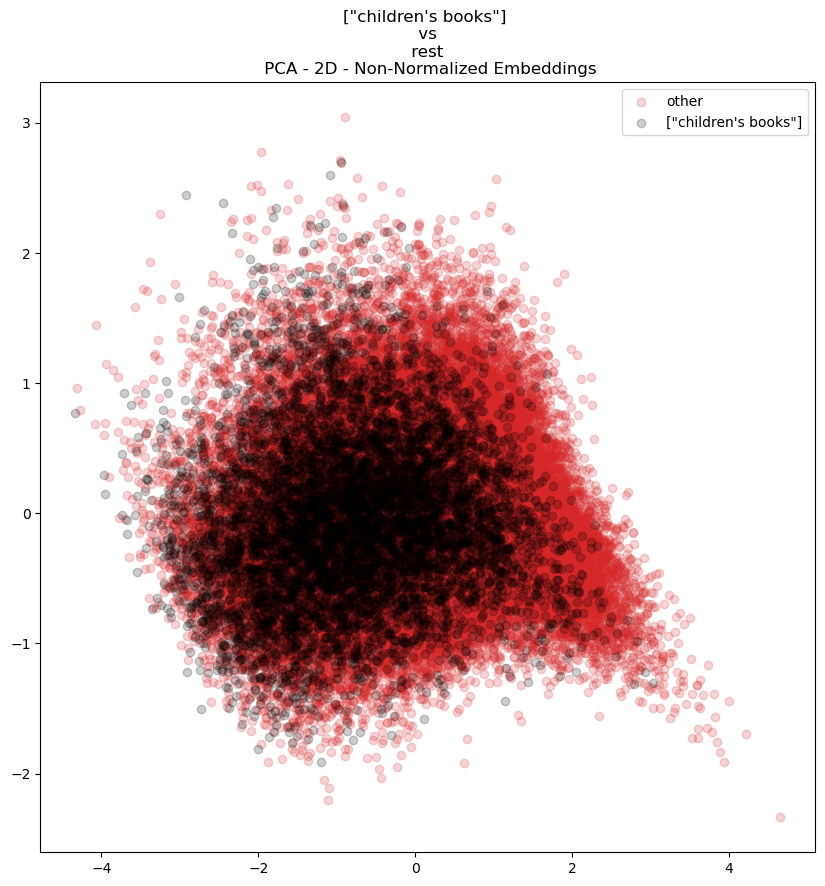

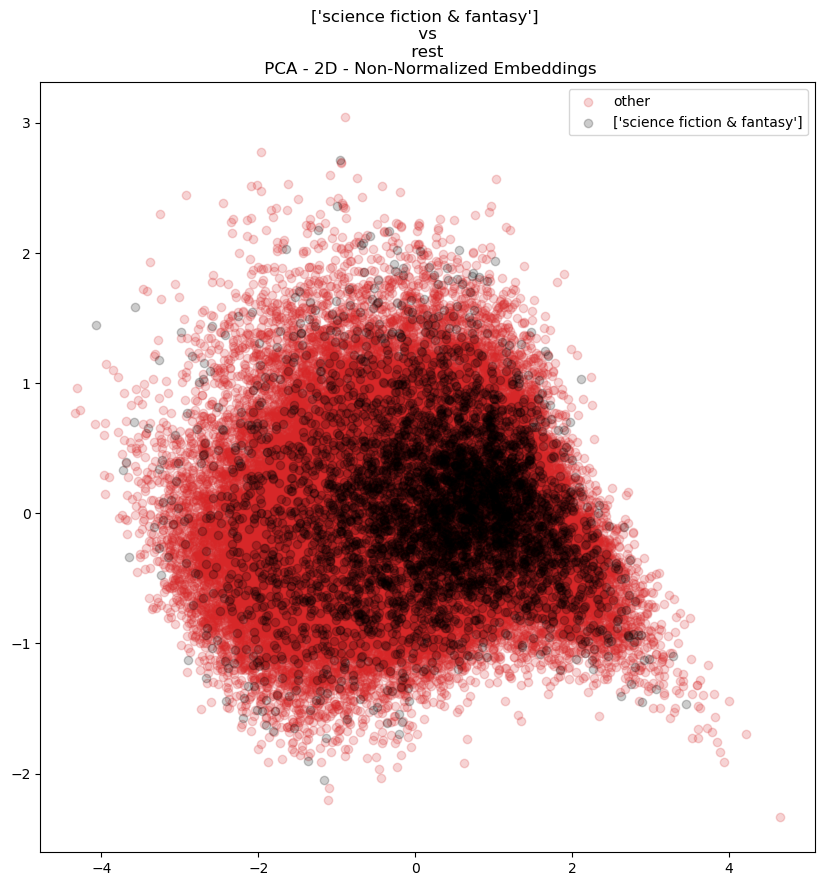

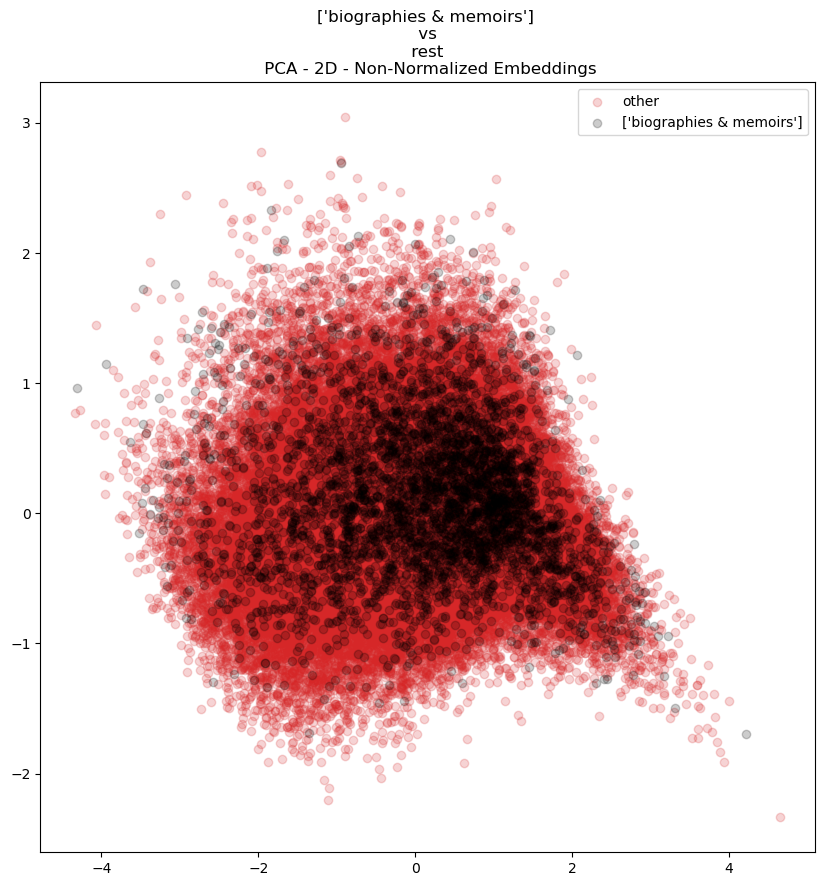

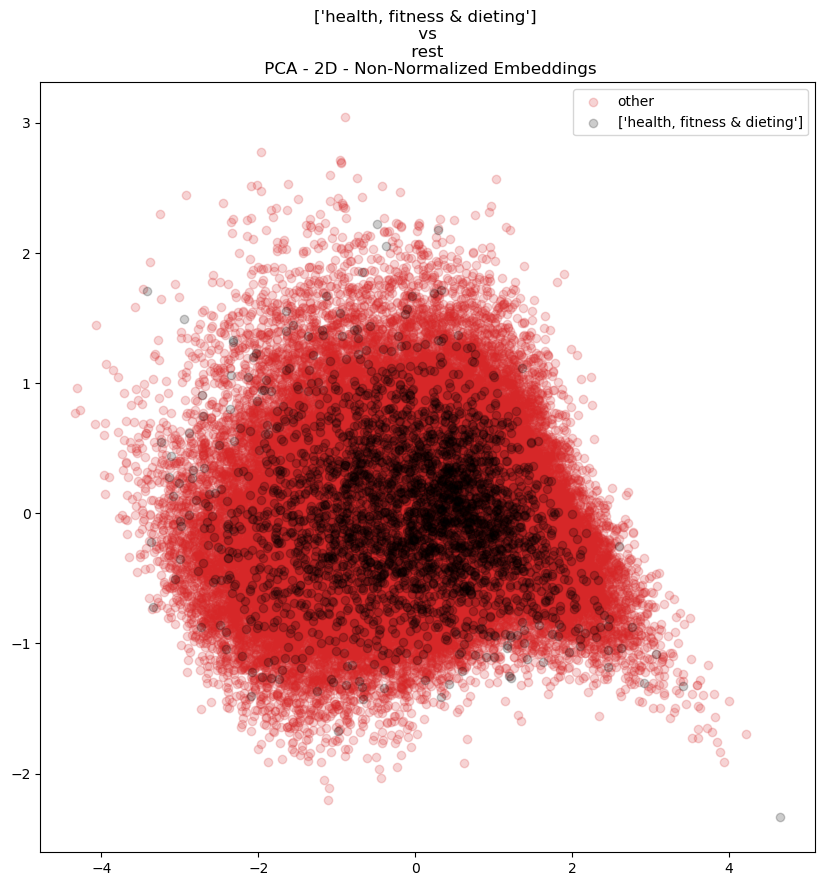

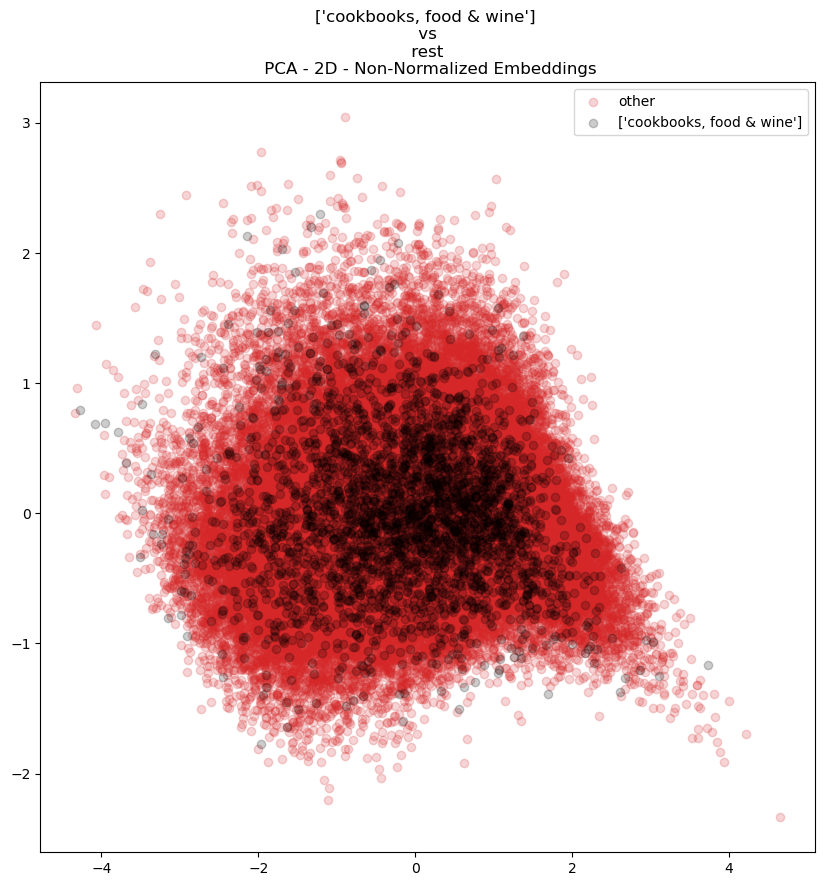

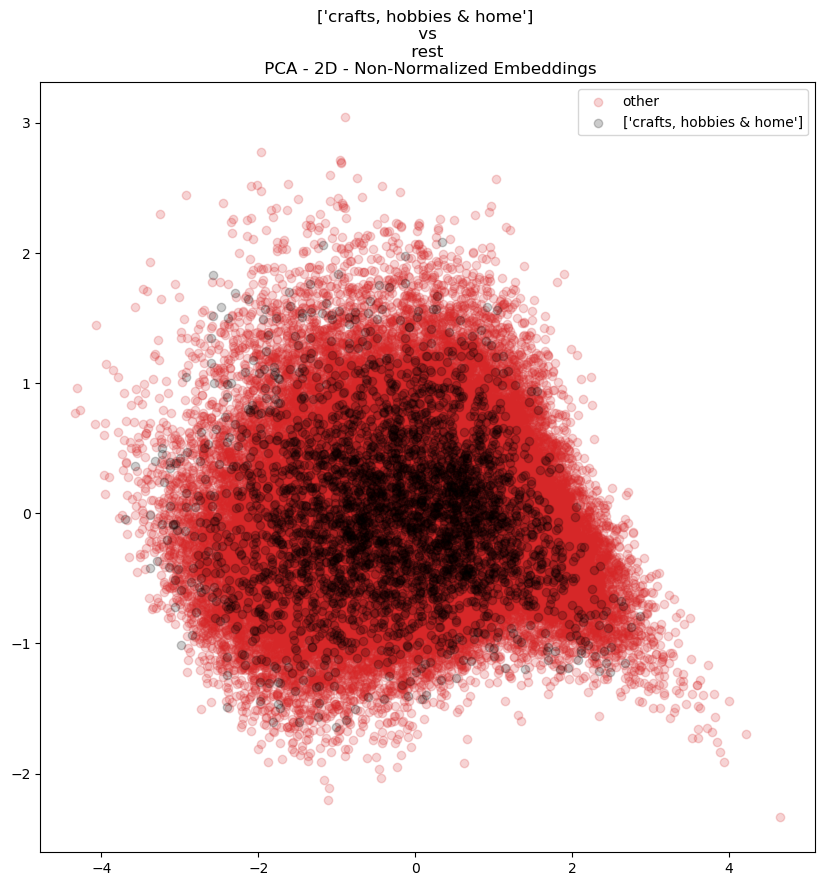

In [11]:
print('PCA - 2D - Non-Normalized Embeddings')
for cat_idx in range(len(top_n_cats)):
    # wrangle categories, indexes, and colors
    include_category = [top_n_cats[cat_idx]]
    include_ids = reviews.book_id[reviews.category.isin(include_category)].drop_duplicates().tolist()
    other_cats = [cat for cat in top_n_cats if cat != include_category[0]]
    other_ids = reviews.book_id[reviews.category.isin(other_cats)].drop_duplicates().tolist()
    include_ints, include_gen = pd.factorize(reviews.drop_duplicates(subset=['book_id']).category[reviews.book_id.isin(include_ids)])
    other_ints, other_gen = pd.factorize(reviews.drop_duplicates(subset=['book_id']).category[reviews.book_id.isin(other_ids)])

    ## plot
    plt.figure(figsize=(10,10))
    plt.scatter(
        pca_results[other_ids, 0],
        pca_results[other_ids, 1],
        c='tab:red',
        alpha=0.2,
        label='other'
    );
    plt.scatter(
        pca_results[include_ids, 0],
        pca_results[include_ids, 1],
        c='black',
        alpha=0.2,
        label=include_category
    );
    plt.legend()

    plt.title('{} \n vs \n rest \n PCA - 2D - Non-Normalized Embeddings'.format(include_category))
    plt.show()

PCA - 2D - Normalized Embeddings


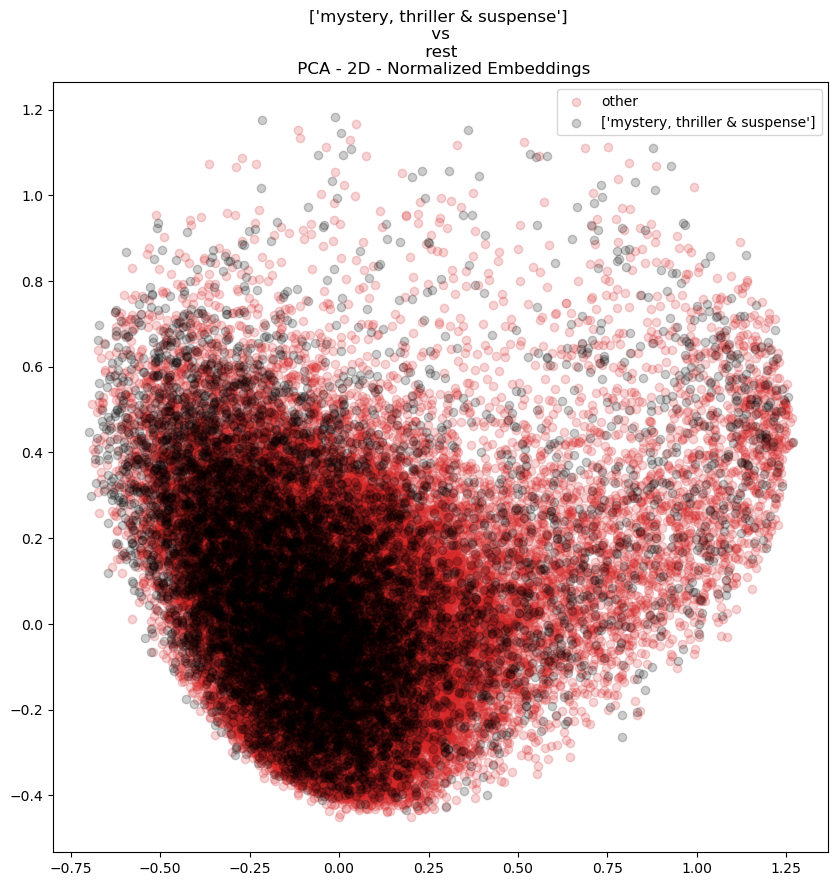

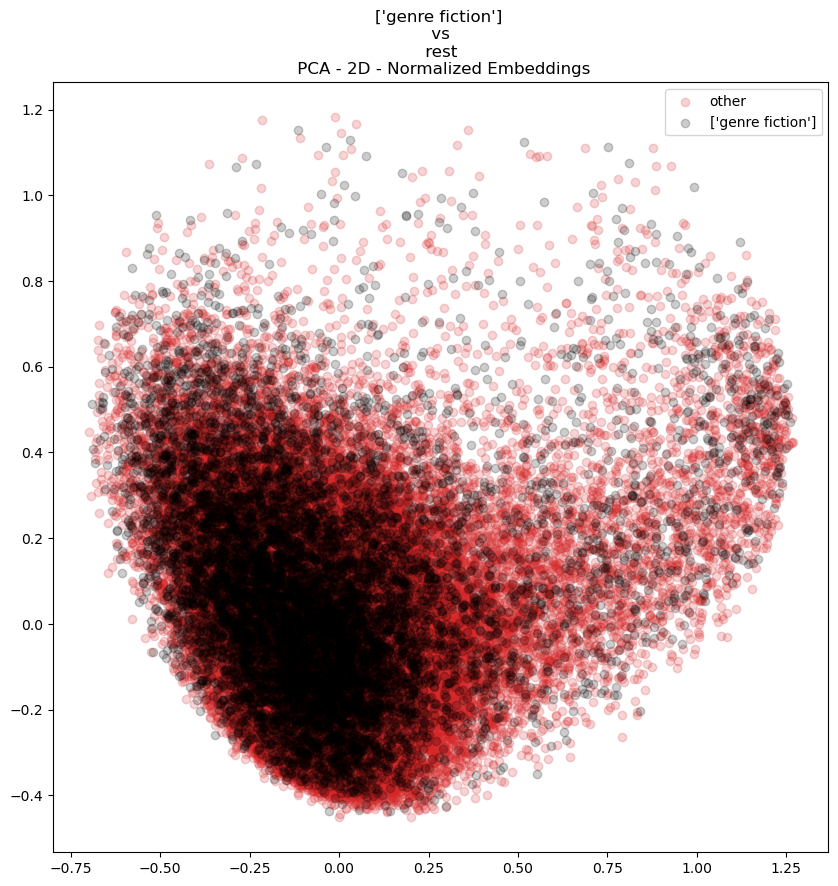

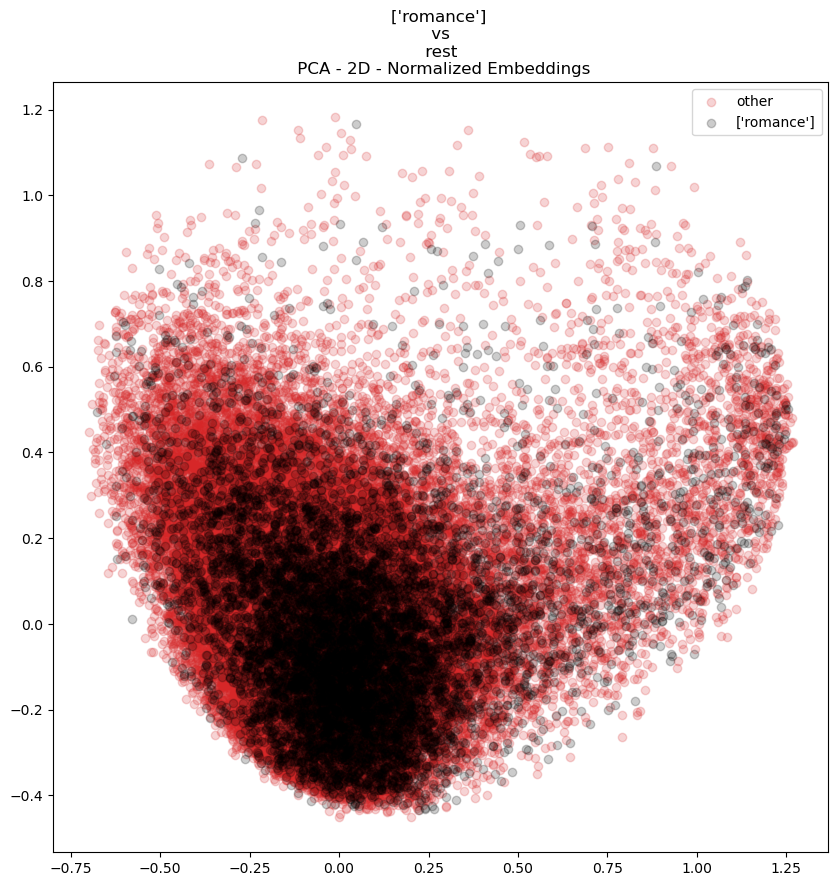

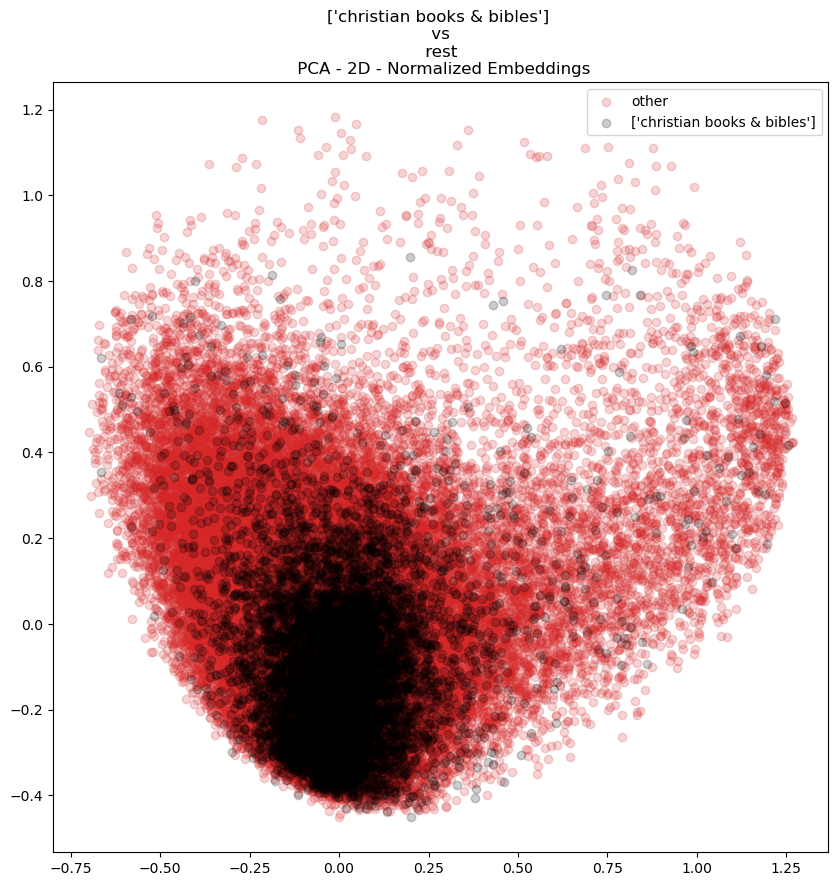

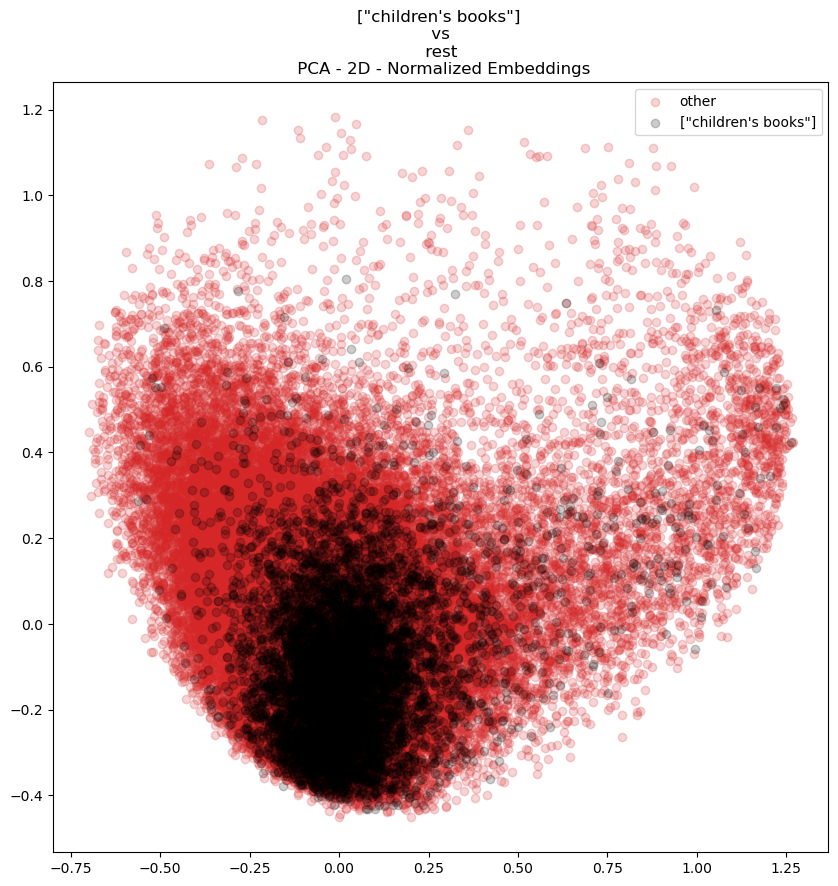

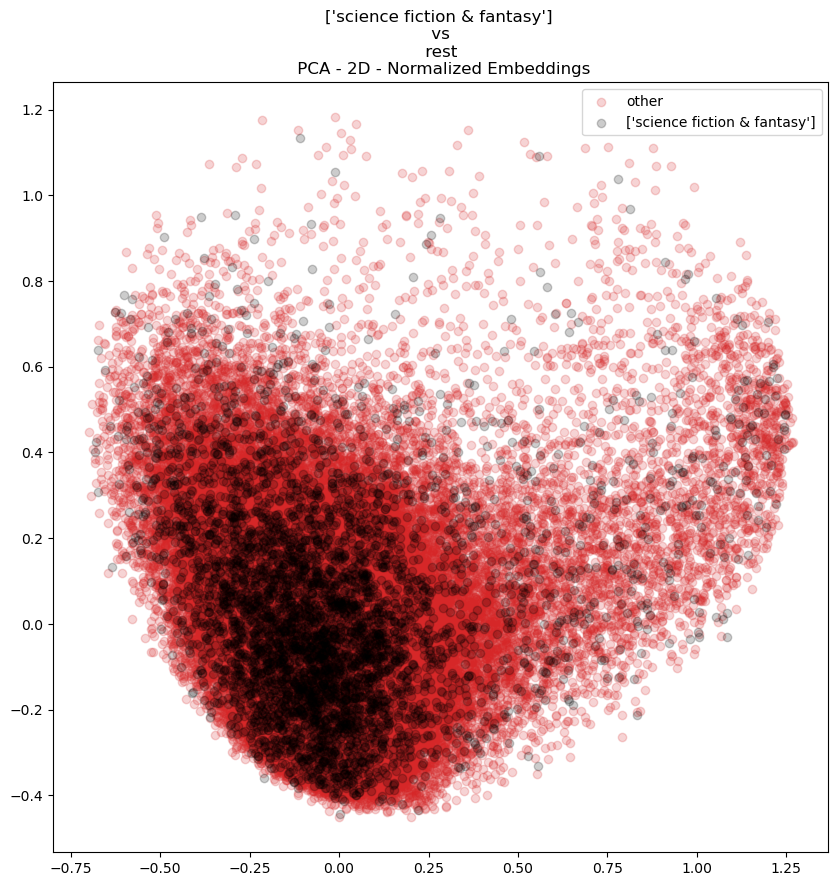

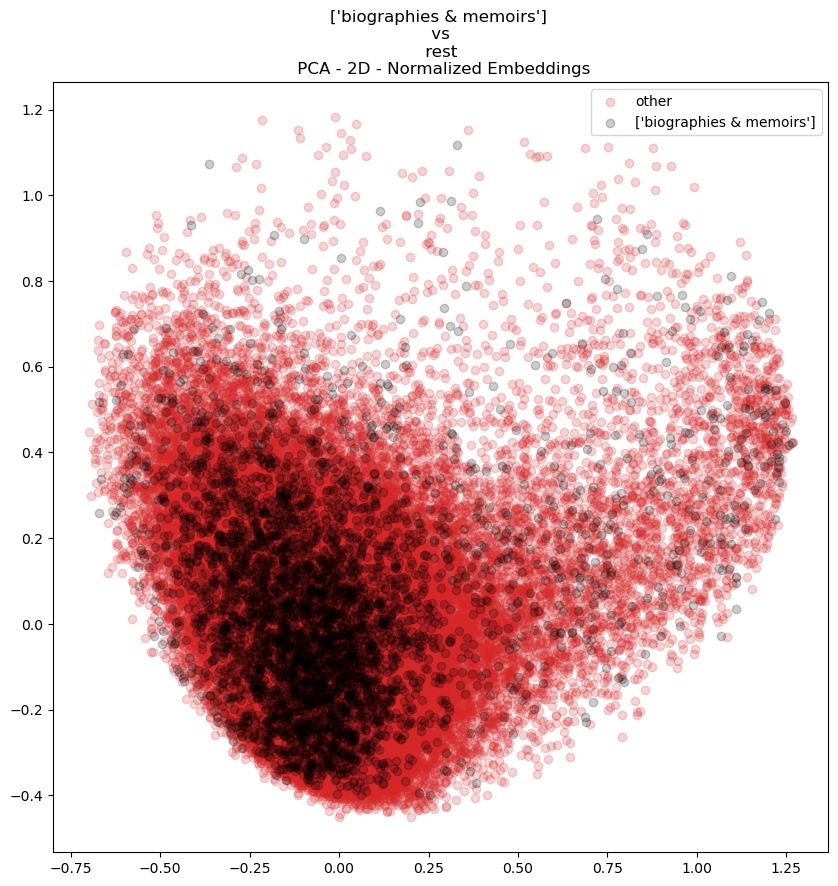

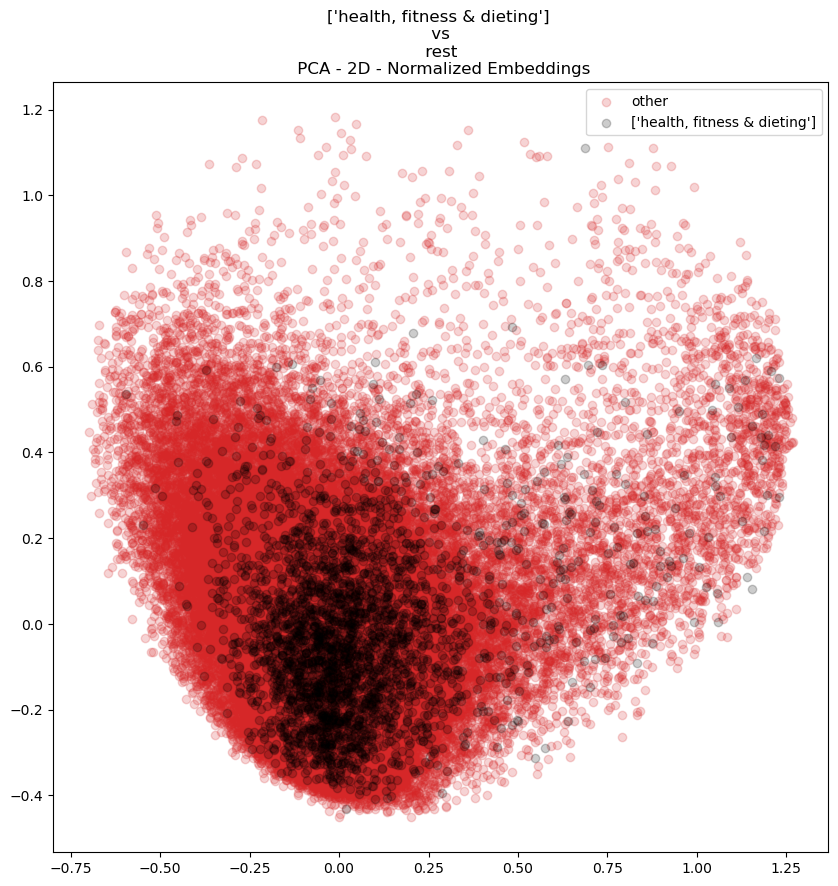

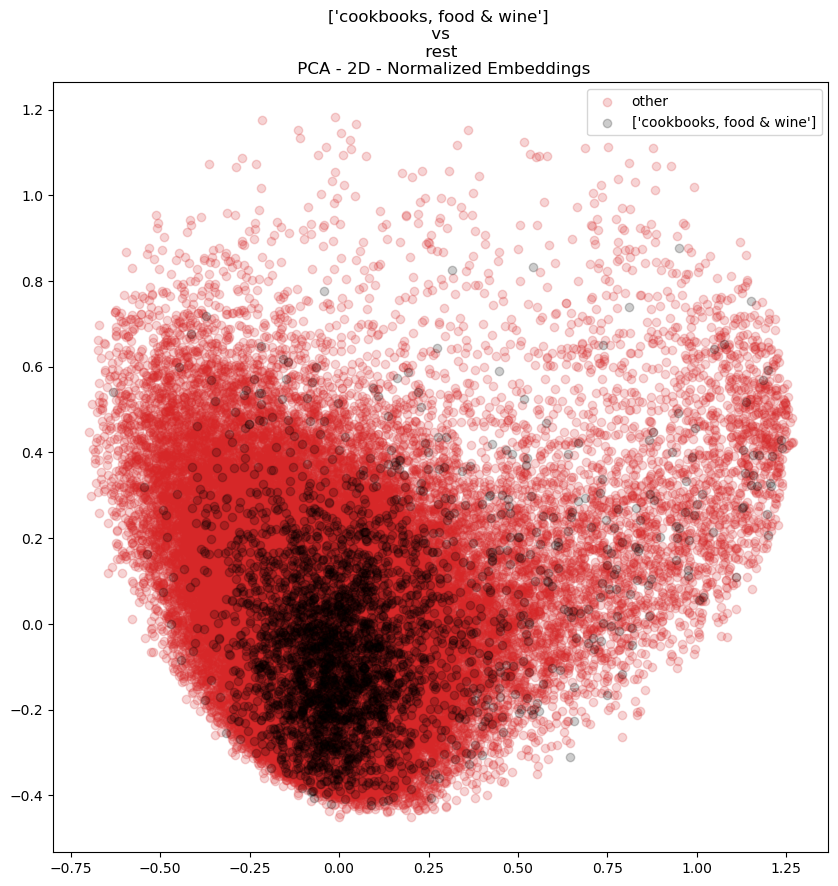

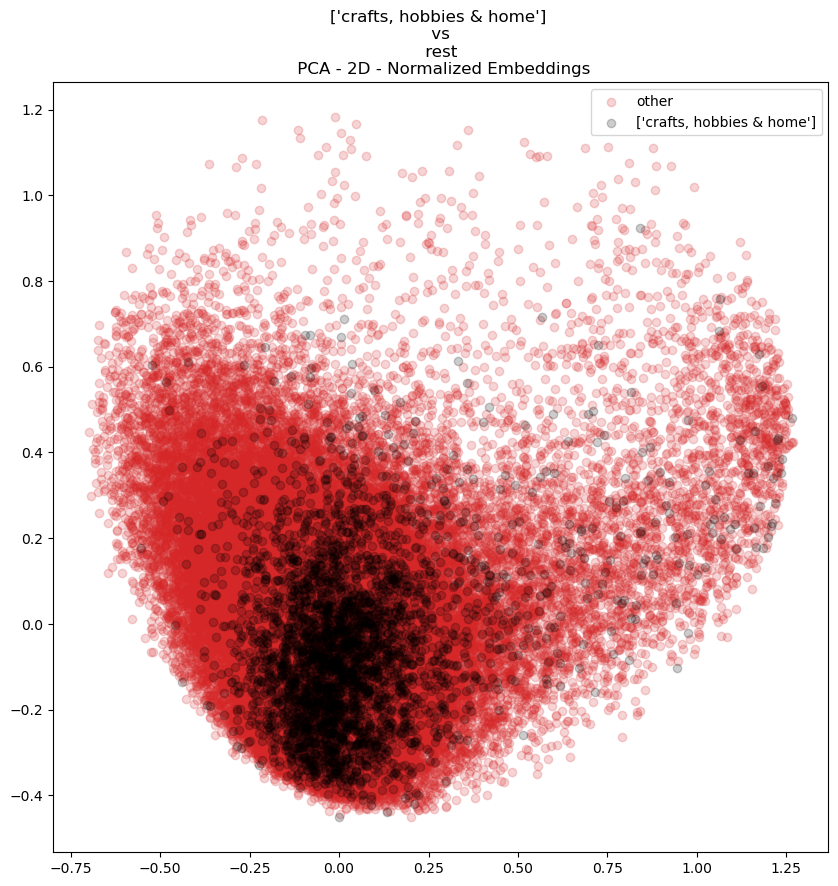

In [12]:
print('PCA - 2D - Normalized Embeddings')
for cat_idx in range(len(top_n_cats)):
    # wrangle categories, indexes, and colors
    include_category = [top_n_cats[cat_idx]]
    include_ids = reviews.book_id[reviews.category.isin(include_category)].drop_duplicates().tolist()
    other_cats = [cat for cat in top_n_cats if cat != include_category[0]]
    other_ids = reviews.book_id[reviews.category.isin(other_cats)].drop_duplicates().tolist()
    include_ints, include_gen = pd.factorize(reviews.drop_duplicates(subset=['book_id']).category[reviews.book_id.isin(include_ids)])
    other_ints, other_gen = pd.factorize(reviews.drop_duplicates(subset=['book_id']).category[reviews.book_id.isin(other_ids)])

    ## plot
    plt.figure(figsize=(10,10))
    plt.scatter(
        pca_results_norm[other_ids, 0],
        pca_results_norm[other_ids, 1],
        c='tab:red',
        alpha=0.2,
        label='other'
    );
    plt.scatter(
        pca_results_norm[include_ids, 0],
        pca_results_norm[include_ids, 1],
        c='black',
        alpha=0.2,
        label=include_category
    );
    plt.legend()

    plt.title('{} \n vs \n rest \n PCA - 2D - Normalized Embeddings'.format(include_category))
    plt.show()

# Recommendations

In [13]:
def book_rec(user_id):
    book_id = list(reviews.book_id.unique())
    book_array = np.array(book_id)
    user_array = np.array([user_id for i in range(len(book_id))])
    prediction = model.predict([book_array, user_array])
    prediction = prediction.reshape(-1)
    prediction_ids = np.argsort(-prediction)[0:5]
    
    recommended_books = books.loc[books.book_id.isin(prediction_ids)]
    return recommended_books

In [14]:
include_ids = reviews.book_id[reviews.category.isin(top_n_cats)].drop_duplicates().tolist()
ints, gen = pd.factorize(reviews.drop_duplicates(subset=['book_id']).category[reviews.book_id.isin(include_ids)])

In [15]:
# my new personal user_id for later use
my_user_id = reviews.user_id[reviews.user_id_original == '7777777'].unique()[0]
my_user_id

5366100

In [16]:
books = reviews.groupby(['book_id','title'], as_index=False).agg(category=('category','first'), avg_rating=('rating','mean'), rating_count=('rating','count'))
recs = book_rec(my_user_id)
recs

2032/2032 [==============================] - 4s 2ms/step


,book_id,title,category,avg_rating,rating_count
18600,18600,mike mulligan and more: four classic stories b...,children's books,4.869863,146
29849,29849,memories of ash (the sunbolt chronicles) (volu...,science fiction & fantasy,4.924107,224
32145,32145,yahooty who?: an illustrated participa-story,children's books,4.995327,214
34529,34529,in my heart: a book of feelings (growing hearts),children's books,4.883212,274
59696,59696,what do you do with a problem?,children's books,4.860806,273


In [17]:
my_review_ids = reviews.book_id[reviews.user_id == my_user_id].unique().tolist()
my_review_titles = reviews.title[reviews.user_id == my_user_id].unique().tolist()

# Recommendations compared to the books I rated
  + The books I've rated are white plus signs +
  + The recommended books are black circles o

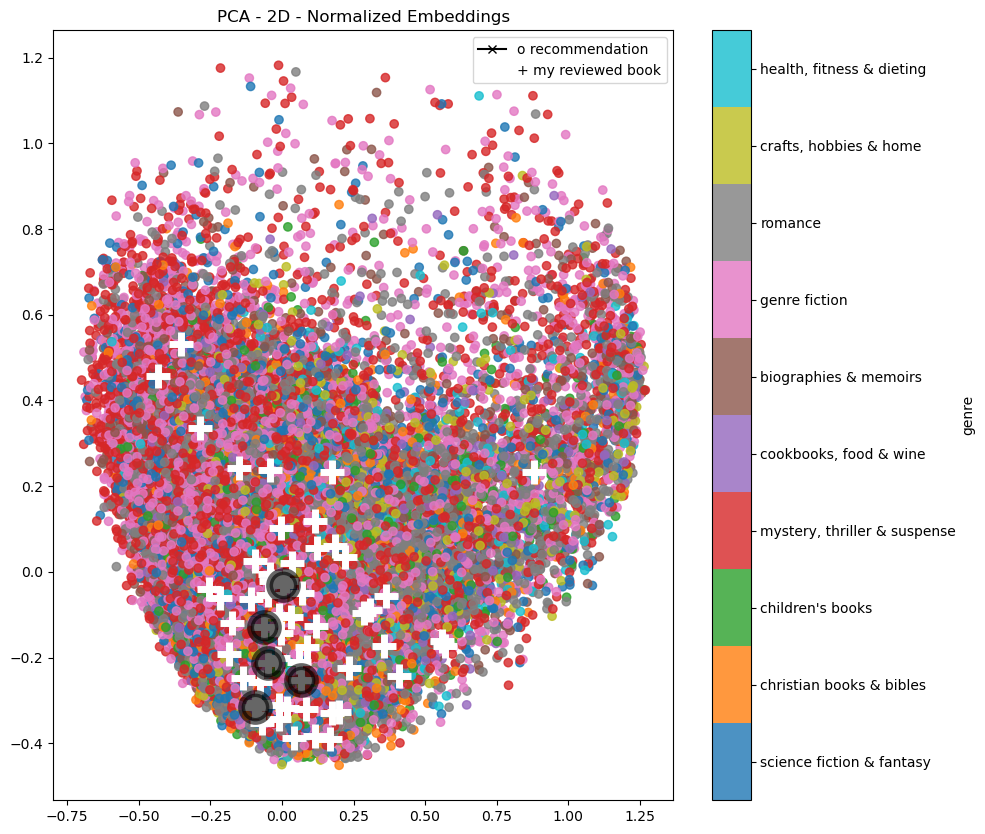

In [18]:
cmap = plt.cm.tab10
# plot
plt.figure(figsize=(10,10))
plt.scatter(
    pca_results_norm[include_ids, 0],
    pca_results_norm[include_ids, 1],
    c=ints,
    cmap=cmap,
    alpha=0.8
)
# colorbar
sm = plt.cm.ScalarMappable(cmap=cmap)
cbar = plt.colorbar(
    boundaries=np.arange(len(set(top_n_cats))+1)-0.5,
    ticks=np.arange(0,len(gen),1), 
    label='genre'
)
cbar.set_ticklabels(gen)
    
# plot my reviewed books
for pca0, pca1, book_title in zip(pca_results_norm[include_ids, 0], pca_results_norm[include_ids, 1], my_review_titles):
    # plot big + on book coordinate
    plt.scatter(
        pca0, pca1,
        c='white',
        s=300,
        marker='+',
        linewidths=5,
     )
# plot recommended books
for pca0, pca1, book_title in zip(pca_results_norm[include_ids, 0], pca_results_norm[include_ids, 1], recs.title):
    # plot big circle on book coordinate
    plt.scatter(
        pca0, pca1,
        c='black',
        s=400,
        marker='o',
        linewidths=5,
        alpha=0.6
     )        


legend_elements = [
    Line2D([], [], color='black', marker='x', label='o recommendation'),
    Line2D([], [], color='white', marker='+', label='+ my reviewed book')
]
plt.legend(handles=legend_elements)

## plot
plt.title('PCA - 2D - Normalized Embeddings')
plt.show()

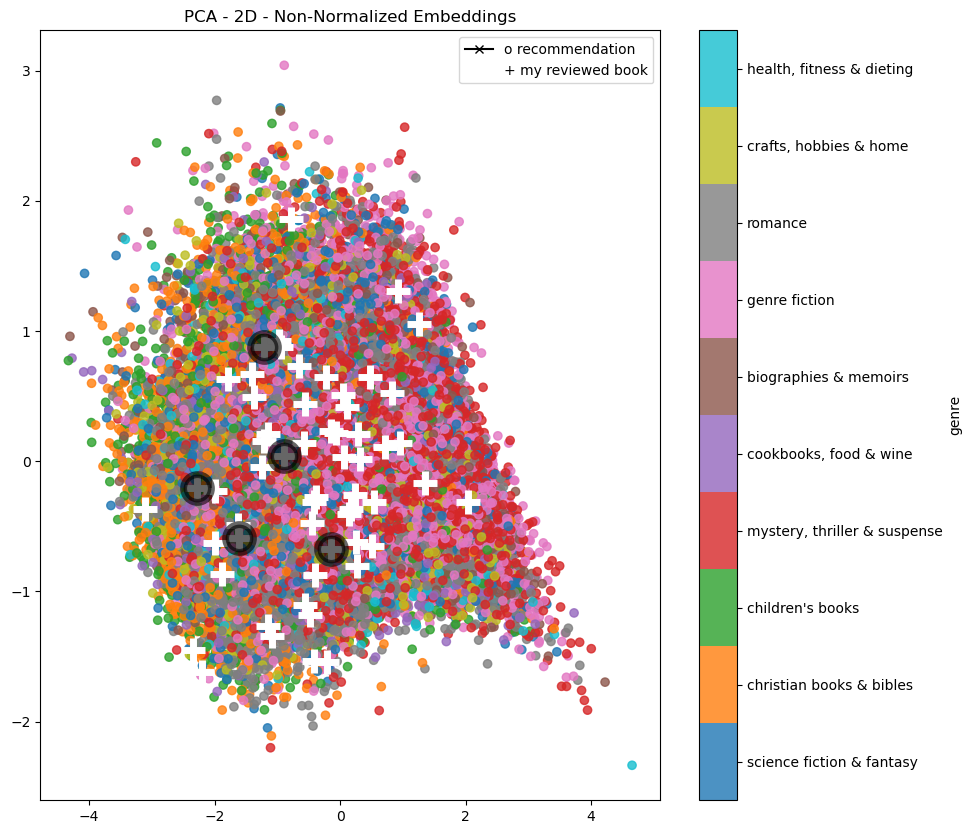

In [19]:
cmap = plt.cm.tab10
# plot
plt.figure(figsize=(10,10))
plt.scatter(
    pca_results[include_ids, 0],
    pca_results[include_ids, 1],
    c=ints,
    cmap=cmap,
    alpha=0.8
)
# colorbar
sm = plt.cm.ScalarMappable(cmap=cmap)
cbar = plt.colorbar(
    boundaries=np.arange(len(set(top_n_cats))+1)-0.5,
    ticks=np.arange(0,len(gen),1), 
    label='genre'
)
cbar.set_ticklabels(gen)

# plot my reviewed books
for pca0, pca1, book_title in zip(pca_results[include_ids, 0], pca_results[include_ids, 1], my_review_titles):
    # plot big + on book coordinate
    plt.scatter(
        pca0, pca1,
        c='white',
        s=300,
        marker='+',
        linewidths=5,
     )
for pca0, pca1, book_title in zip(pca_results[include_ids, 0], pca_results[include_ids, 1], recs.title):
    # plot big circle on book coordinate
    plt.scatter(
        pca0, pca1,
        c='black',
        s=400,
        marker='o',
        linewidths=5,
        alpha=0.6
     )        

legend_elements = [
    Line2D([], [], color='black', marker='x', label='o recommendation'),
    Line2D([], [], color='white', marker='+', label='+ my reviewed book')
]
plt.legend(handles=legend_elements)
## plot
plt.title('PCA - 2D - Non-Normalized Embeddings')
plt.show()